# Detecting emotions in children’s drawings

**Installing Dependencies:**

In [0]:
# we need pillow version of 5.3.0
# we will uninstall the older version first
#!pip uninstall -y Pillow
# install the new one
!pip install Pillow==5.3.0
# import the new one
import PIL
print(PIL.PILLOW_VERSION)
# this should print 5.3.0. If it doesn't, then restart your runtime:
# Menu > Runtime > Restart Runtime
!pip install image
!pip3 install http://download.pytorch.org/whl/cu80/torch-0.4.0-cp36-cp36m-linux_x86_64.whl
!pip3 install torchvision

    100% |████████████████████████████████| 2.0MB 16.1MB/s 
imgaug 0.2.8 has requirement numpy>=1.15.0, but you'll have numpy 1.14.6 which is incompatible.
fastai 1.0.46 has requirement numpy>=1.15, but you'll have numpy 1.14.6 which is incompatible.
albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.8 which is incompatible.
  Found existing installation: Pillow 4.1.1
    Uninstalling Pillow-4.1.1:
      Successfully uninstalled Pillow-4.1.1


4.1.1
    100% |████████████████████████████████| 484.0MB 56.3MB/s 
fastai 1.0.46 has requirement numpy>=1.15, but you'll have numpy 1.14.6 which is incompatible.
fastai 1.0.46 has requirement torch>=1.0.0, but you'll have torch 0.4.0 which is incompatible.
  Found existing installation: torch 1.0.1.post2
    Uninstalling torch-1.0.1.post2:
      Successfully uninstalled torch-1.0.1.post2


In [0]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import glob
import matplotlib.pyplot as plt
import torch
import time
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models
import torchvision
from collections import OrderedDict
from torch.autograd import Variable
from PIL import Image
import PIL
from torch.optim import lr_scheduler
import copy
import json
import os
from os.path import exists
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [0]:
!unzip Children_emotions.zip

Archive:  Children_emotions.zip
   creating: Children_emotions/
   creating: Children_emotions/Train/
   creating: Children_emotions/Train/Anger and Violence/
 extracting: Children_emotions/Train/Anger and Violence/13.png  
  inflating: Children_emotions/Train/Anger and Violence/14.jpg  
  inflating: Children_emotions/Train/Anger and Violence/15.jpg  
  inflating: Children_emotions/Train/Anger and Violence/16.jpg  
  inflating: Children_emotions/Train/Anger and Violence/17.jpg  
  inflating: Children_emotions/Train/Anger and Violence/18.jpg  
  inflating: Children_emotions/Train/Anger and Violence/19.jpg  
  inflating: Children_emotions/Train/Anger and Violence/20.jpg  
  inflating: Children_emotions/Train/Anger and Violence/21.jpg  
  inflating: Children_emotions/Train/Anger and Violence/22.jpg  
  inflating: Children_emotions/Train/Anger and Violence/23.jpg  
  inflating: Children_emotions/Train/Anger and Violence/25.jpg  
  inflating: Children_emotions/Train/Anger and Violence/26.jp

In [0]:
data_dir = '/Children_emotions'
train_dir = data_dir + '/Train'
valid_dir = data_dir + '/Valid'
nThreads = 4
batch_size = 16
use_gpu = torch.cuda.is_available()

In [0]:
# we will verify that GPU is enabled for this notebook
# following should print: CUDA is available!  Training on GPU ...
# 
# if it prints otherwise, then you need to enable GPU: 
# from Menu > Runtime > Change Runtime Type > Hardware Accelerator > GPU

import torch
import numpy as np

# check if CUDA is available
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')

CUDA is available!  Training on GPU ...


**Data Augmentation:**

In [0]:
# Define your transforms for the training and validation sets
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'Train': transforms.Compose([
        #transforms.RandomRotation(24),
        transforms.RandomResizedCrop(224),
        #transforms.ColorJitter(contrast=0),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'Valid': transforms.Compose([
        transforms.Resize(177),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# Load the datasets with ImageFolder

data_dir = 'Children_emotions'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['Train', 'Valid']}

# Using the image datasets and the transforms, define the dataloaders
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=2)
              for x in ['Train', 'Valid']}

dataset_sizes = {x: len(image_datasets[x]) for x in ['Train', 'Valid']}


class_names= image_datasets['Train'].classes

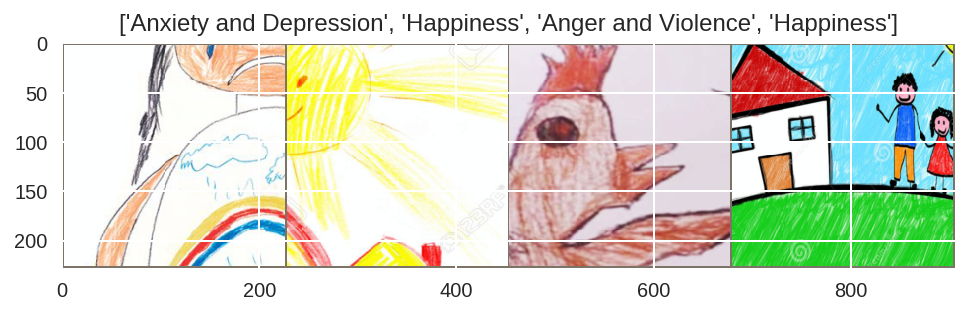

In [0]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['Train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)
plt.figure(figsize=(8, 8))
imshow(out, title=[class_names[x] for x in classes])

**Creating the model:**

In [0]:
# Build and train your network

# 1. Load resnet-152 pre-trained network
model = models.resnet152(pretrained=True)
# Freeze parameters so we don't backprop through them

for param in model.parameters():
    param.requires_grad = False

print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=F

In [0]:
# 2. Define a new, untrained feed-forward network as a classifier, using ReLU activations and dropout

# our input_size matches the in_features of pretrained model


from collections import OrderedDict


# creating the classifier ordered dictionary first

classifier = nn.Sequential(OrderedDict([
                          ('fc1', nn.Linear(2048, 1024)),
                          ('relu', nn.ReLU()),
                          ('fc2', nn.Linear(1024, 3)),
                          ('output', nn.LogSoftmax(dim=1))
                          ]))



# replacing the pretrained model classifier with our classifier
model.fc = classifier

**Training the model:**

In [0]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=10):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(1, num_epochs+1):
        print('Epoch {}/{}'.format(epoch, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['Train', 'Valid']:
            if phase == 'Train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'Train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'Train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'Valid' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best valid accuracy: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [0]:
#Train a model with a pre-trained network
num_epochs = 5
if use_gpu:
    print ("Using GPU: "+ str(use_gpu))
    model = model.cuda()

# NLLLoss because our output is LogSoftmax
criterion = nn.NLLLoss()

 #Adam optimizer with a learning rate
optimizer = optim.Adam(model.fc.parameters(), lr=0.0001)
#optimizer = optim.SGD(model.fc.parameters(), lr = .1, momentum=0.9)
# Decay LR by a factor of 0.1 every 5 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)


model_ft = train_model(model, criterion, optimizer, exp_lr_scheduler, num_epochs=10)

Using GPU: True
Epoch 1/10
----------
Train Loss: 0.6896 Acc: 0.6897
Valid Loss: 0.6774 Acc: 0.6944

Epoch 2/10
----------
Train Loss: 0.6659 Acc: 0.6749
Valid Loss: 0.6891 Acc: 0.6667

Epoch 3/10
----------
Train Loss: 0.6864 Acc: 0.7044
Valid Loss: 0.7754 Acc: 0.5833

Epoch 4/10
----------
Train Loss: 0.6125 Acc: 0.7438
Valid Loss: 0.6636 Acc: 0.7222

Epoch 5/10
----------
Train Loss: 0.5951 Acc: 0.7192
Valid Loss: 0.6791 Acc: 0.6944

Epoch 6/10
----------
Train Loss: 0.6286 Acc: 0.7389
Valid Loss: 0.5648 Acc: 0.7778

Epoch 7/10
----------
Train Loss: 0.6640 Acc: 0.6897
Valid Loss: 0.6552 Acc: 0.7222

Epoch 8/10
----------
Train Loss: 0.5879 Acc: 0.7389
Valid Loss: 0.6225 Acc: 0.8056

Epoch 9/10
----------
Train Loss: 0.5576 Acc: 0.7783
Valid Loss: 0.6279 Acc: 0.6944

Epoch 10/10
----------
Train Loss: 0.6723 Acc: 0.7143
Valid Loss: 0.6050 Acc: 0.8056

Training complete in 1m 47s
Best valid accuracy: 0.805556


**Validation:**

In [0]:
# Do validation on the test set
def test(model, dataloaders, device):
  model.eval()
  accuracy = 0
  
  model.to(device)
    
  for images, labels in dataloaders['Valid']:
    images = Variable(images)
    labels = Variable(labels)
    images, labels = images.to(device), labels.to(device)
      
    output = model.forward(images)
    ps = torch.exp(output)
    equality = (labels.data == ps.max(1)[1])
    accuracy += equality.type_as(torch.FloatTensor()).mean()
      
    print("Testing Accuracy: {:.3f}".format(accuracy/len(dataloaders['Valid'])))

In [0]:
test(model, dataloaders, device)

Testing Accuracy: 0.028
Testing Accuracy: 0.139
Testing Accuracy: 0.222
Testing Accuracy: 0.333
Testing Accuracy: 0.444
Testing Accuracy: 0.500
Testing Accuracy: 0.611
Testing Accuracy: 0.722
Testing Accuracy: 0.806


In [0]:
# Save the checkpoint 


model.class_to_idx = dataloaders['Train'].dataset.class_to_idx
model.epochs = num_epochs
checkpoint = {'input_size': [3, 224, 224],
                 'batch_size': dataloaders['Train'].batch_size,
                  'output_size':3,
                  'state_dict': model.state_dict(),
                  'data_transforms': data_transforms,
                  'optimizer_dict':optimizer.state_dict(),
                  'class_to_idx': model.class_to_idx,
                  'epoch': model.epochs}
torch.save(checkpoint, 'emotions80_checkpoint.pth')

In [0]:
# Write a function that loads a checkpoint and rebuilds the model

def load_checkpoint(filepath):
    checkpoint = torch.load(filepath)
    model = models.resnet152()
    
    # our input_size matches the in_features of pretrained model
    input_size = 2048
    output_size = 5
    
    classifier = nn.Sequential(OrderedDict([
                          ('fc1', nn.Linear(2048, 1024)),
                          ('relu', nn.ReLU()),
                          #('dropout1', nn.Dropout(p=0.2)),
                          ('fc2', nn.Linear(1024, 3)),
                          ('output', nn.LogSoftmax(dim=1))
                          ]))


    # replacing the pretrained model classifier with our classifier
    model.fc = classifier
    
    
    model.load_state_dict(checkpoint['state_dict'])
    
    return model, checkpoint['class_to_idx']

# get index to class mapping
loaded_model, class_to_idx = load_checkpoint('emotions80_checkpoint.pth')
idx_to_class = { v : k for k,v in class_to_idx.items()}

In [0]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['Valid']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

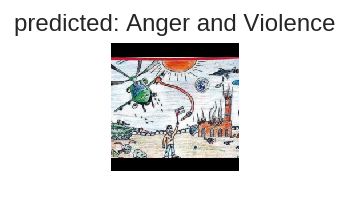

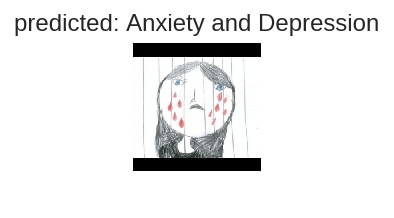

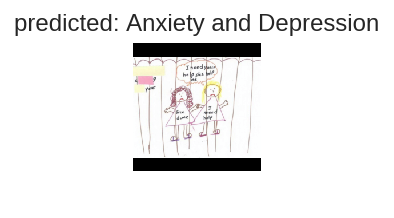

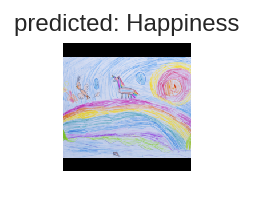

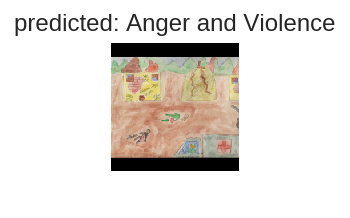

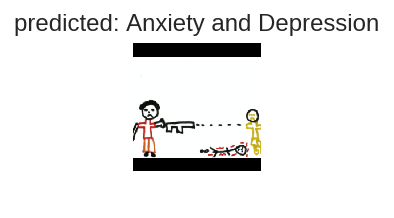

In [0]:
visualize_model(model_ft)

In [0]:
def process_image(image):
    ''' Scales, crops, and normalizes a PIL image for a PyTorch model,
        returns an Numpy array
    '''
    
    # Process a PIL image for use in a PyTorch model

    size = 361, 361
    image.thumbnail(size, Image.ANTIALIAS)
    image = image.crop((128 - 112, 128 - 112, 128 + 112, 128 + 112))
    npImage = np.array(image)
    npImage = npImage/255.
        
    imgA = npImage[:,:,0]
    imgB = npImage[:,:,1]
    imgC = npImage[:,:,2]
    
    imgA = (imgA - 0.485)/(0.229) 
    imgB = (imgB - 0.456)/(0.224)
    imgC = (imgC - 0.406)/(0.225)
        
    npImage[:,:,0] = imgA
    npImage[:,:,1] = imgB
    npImage[:,:,2] = imgC
    
    npImage = np.transpose(npImage, (2,0,1))
    
    return npImage

In [0]:
def imshow(image, ax=None, title=None):
    """Imshow for Tensor."""
    if ax is None:
        fig, ax = plt.subplots()
    
    # PyTorch tensors assume the color channel is the first dimension
    # but matplotlib assumes is the third dimension
    image = image.numpy().transpose((1, 2, 0))
    
    # Undo preprocessing
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean
    
    # Image needs to be clipped between 0 and 1 or it looks like noise when displayed
    image = np.clip(image, 0, 1)
    
    ax.imshow(image)
    
    return ax

In [0]:
def predict(image_path, model, topk=5):
    ''' Predict the class (or classes) of an image using a trained deep learning model.
    '''
    
    # Implement the code to predict the class from an image file
    
    image = torch.FloatTensor([process_image(Image.open(image_path))])
    model.eval()
    output = model.forward(Variable(image))
    probabilities = torch.exp(output).data.numpy()[0]
    

    top_idx = np.argsort(probabilities)[-topk:][::-1] 
    top_class = [idx_to_class[x] for x in top_idx]
    top_probability = probabilities[top_idx]

    return top_probability, top_class

In [0]:
print (predict('Children_emotions/Valid/Happiness/2.jpg', loaded_model))

(array([0.822965  , 0.09224104, 0.08479392], dtype=float32), ['Happiness', 'Anxiety and Depression', 'Anger and Violence'])


In [0]:
# Display an image along with the top  classes
def view_classify(img, probabilities, classes, mapper):
    ''' Function for viewing an image and it's predicted classes.
    '''
    img_filename = 'Prediction'
    img = Image.open(img)

    fig, (ax1, ax2) = plt.subplots(figsize=(6,10),  ncols=1, nrows=2)
    ct_name = img_filename
    
    ax1.set_title(ct_name)
    ax1.imshow(img)
    ax1.axis('off')
    
    y_pos = np.arange(len(probabilities))
    ax2.barh(y_pos, probabilities, color='blue')
    ax2.set_yticks(y_pos)
    ax2.set_yticklabels(x for x in classes)
    ax2.invert_yaxis()

**Making predictions:**

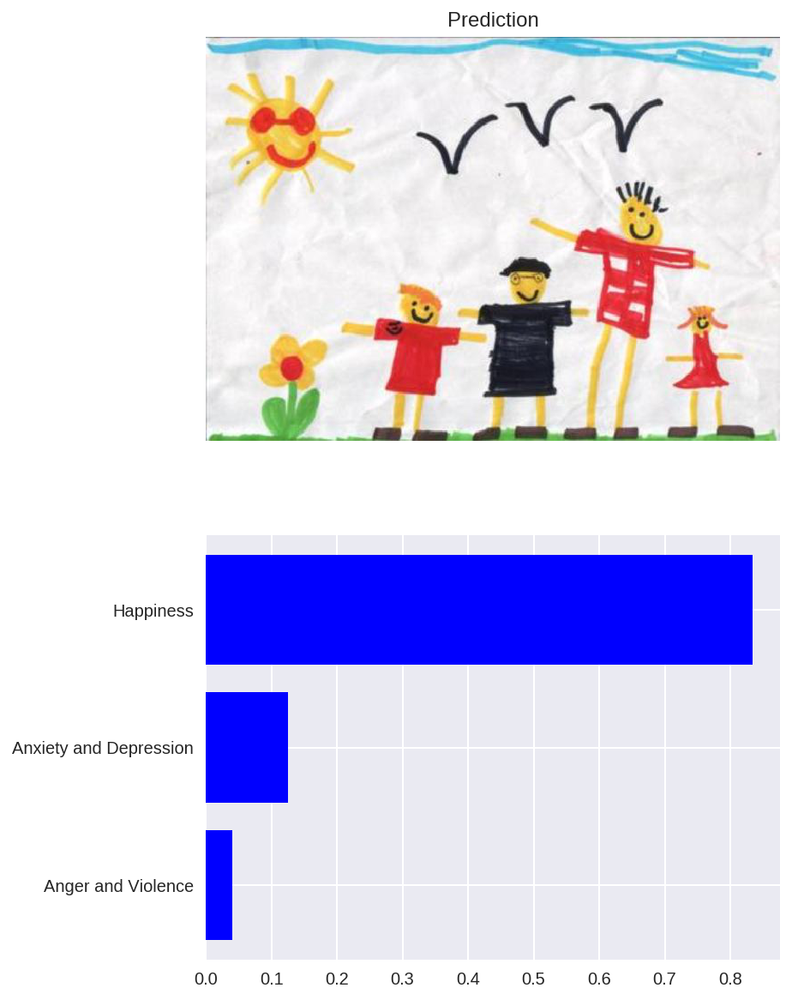

In [0]:
img = 'Children_emotions/Valid/Happiness/2.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

In [0]:
img = 'Children_emotions/Valid/Anxiety and Depression/5.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

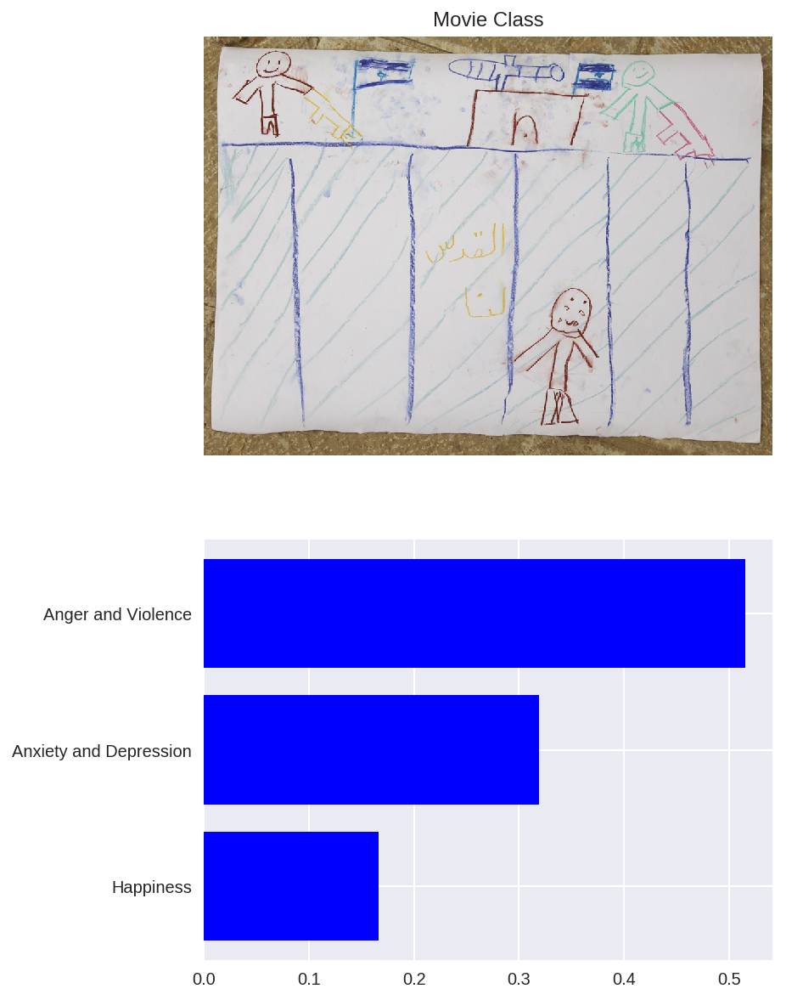

In [0]:
img = 'Children_emotions/Valid/Anger and Violence/4.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

In [0]:
# Use GPU if it's available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Freeze parameters so we don't backprop through them
for param in model.parameters():
    param.requires_grad = False
    
classifier = nn.Sequential(OrderedDict([
                          ('fc1', nn.Linear(2048, 1024)),
                          ('relu', nn.ReLU()),
                          ('fc2', nn.Linear(1024, 3)),
                          ('output', nn.LogSoftmax(dim=1))
                          ]))
# replacing the pretrained model classifier with our classifier
model.fc = classifier

criterion = nn.NLLLoss()

# Only train the classifier parameters, feature parameters are frozen
optimizer = optim.Adam(model.fc.parameters(), lr=0.0001)

model.to(device);

#Train the model
#Ie. for epoch in range(epochs):
#     for inputs, labels in trainloader:
#         steps += 1
#         # Move input and label tensors to the default device
#         inputs, labels = inputs.to(device), labels.to(device)
        
#         optimizer.zero_grad()
        
#         logps = model.forward(inputs)
#         loss = criterion(logps, labels)
#         loss.backward()
#         optimizer.step()
#       ....... REFER to GitHub for full train source code

# Save the model
torch.save(model.fc.state_dict(),'emotions_80_checkpoint.pth')

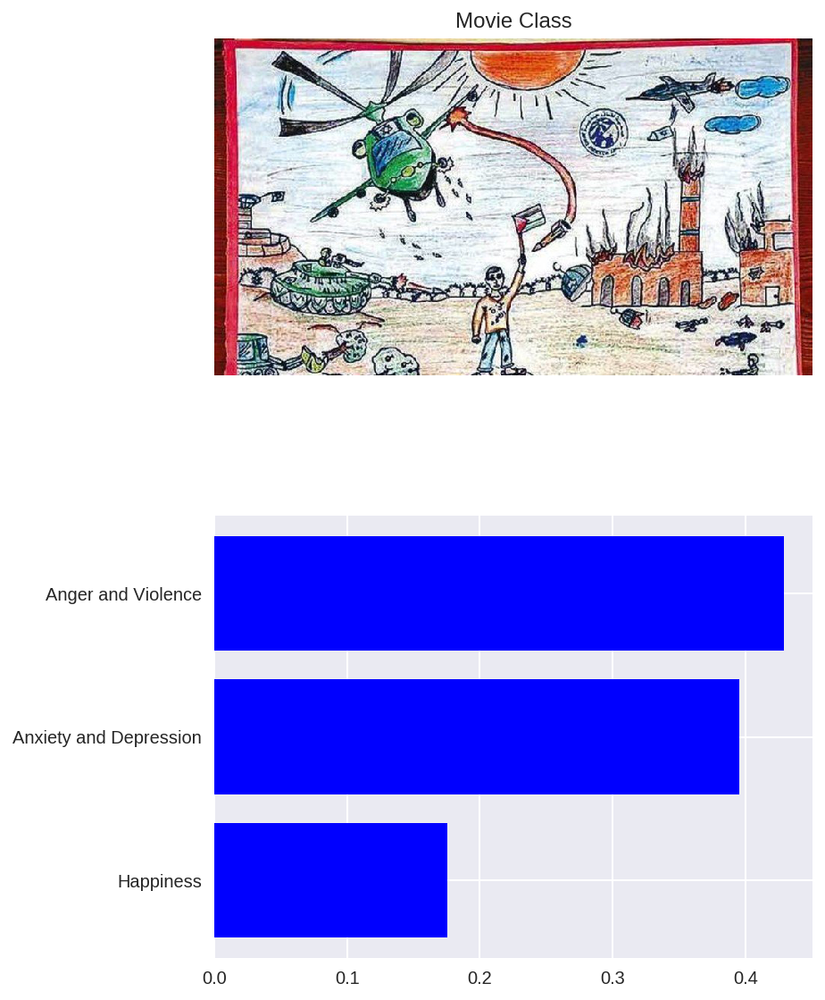

In [0]:
img = 'Children_emotions/Valid/Anger and Violence/8.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

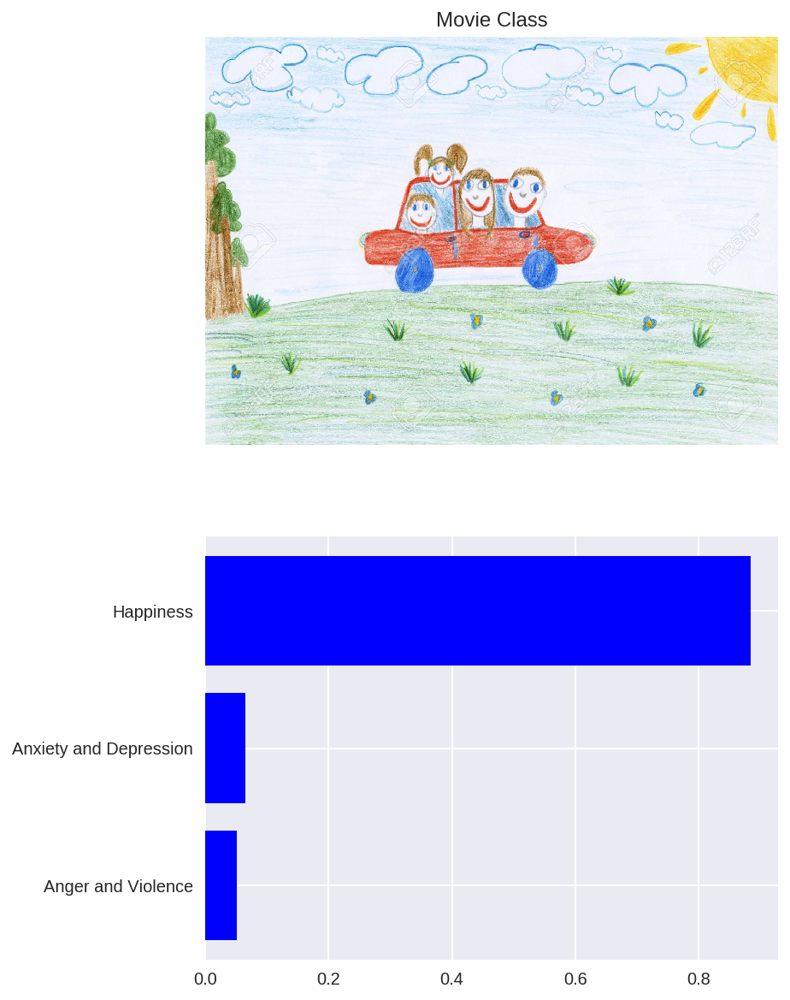

In [0]:
img = 'Children_emotions/Valid/Happiness/9.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

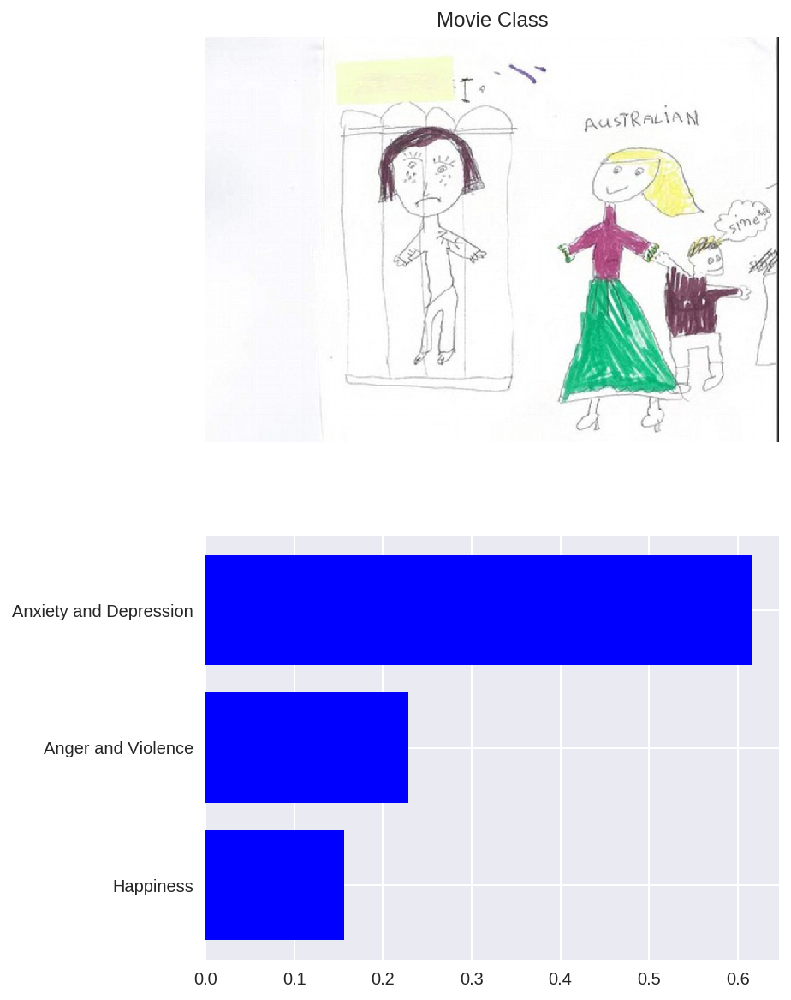

In [0]:
img = 'Children_emotions/Valid/Anxiety and Depression/7.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

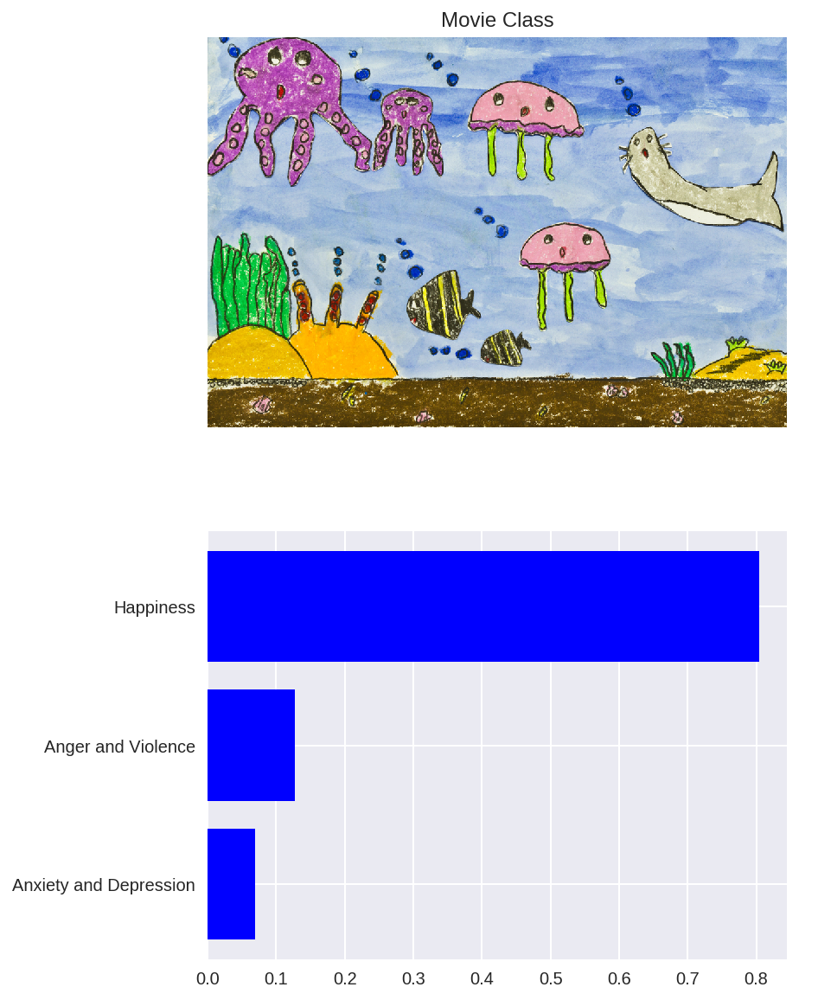

In [0]:
img = 'ocean-drawing.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

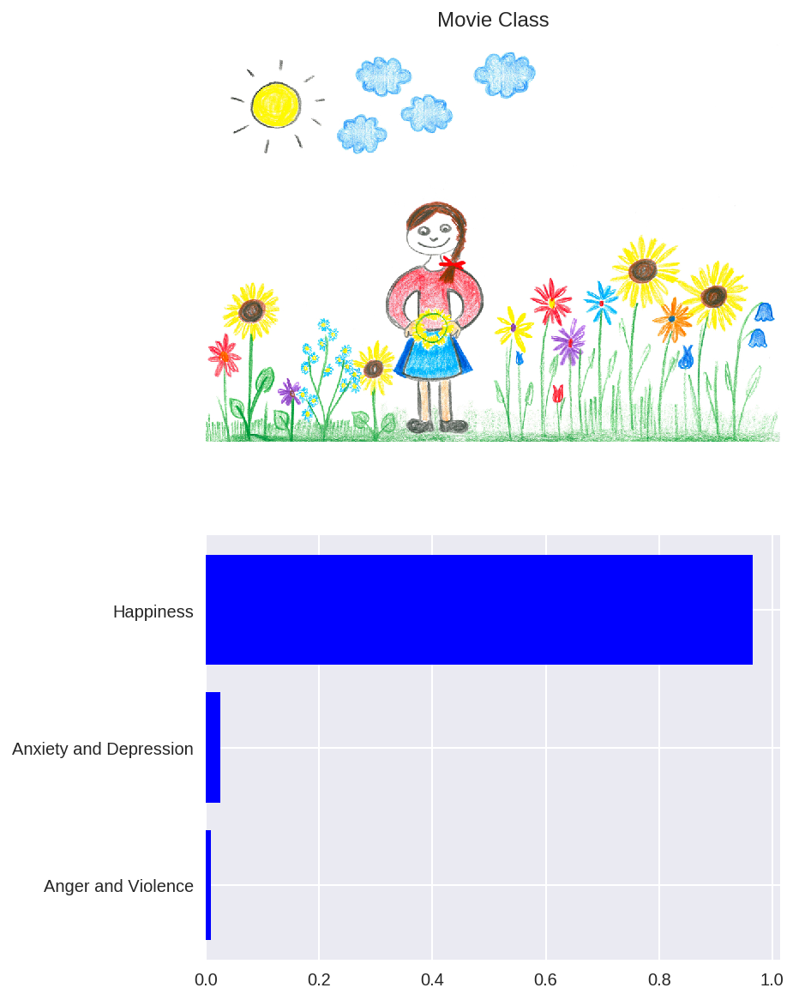

In [0]:
img = 'girls-drawing.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

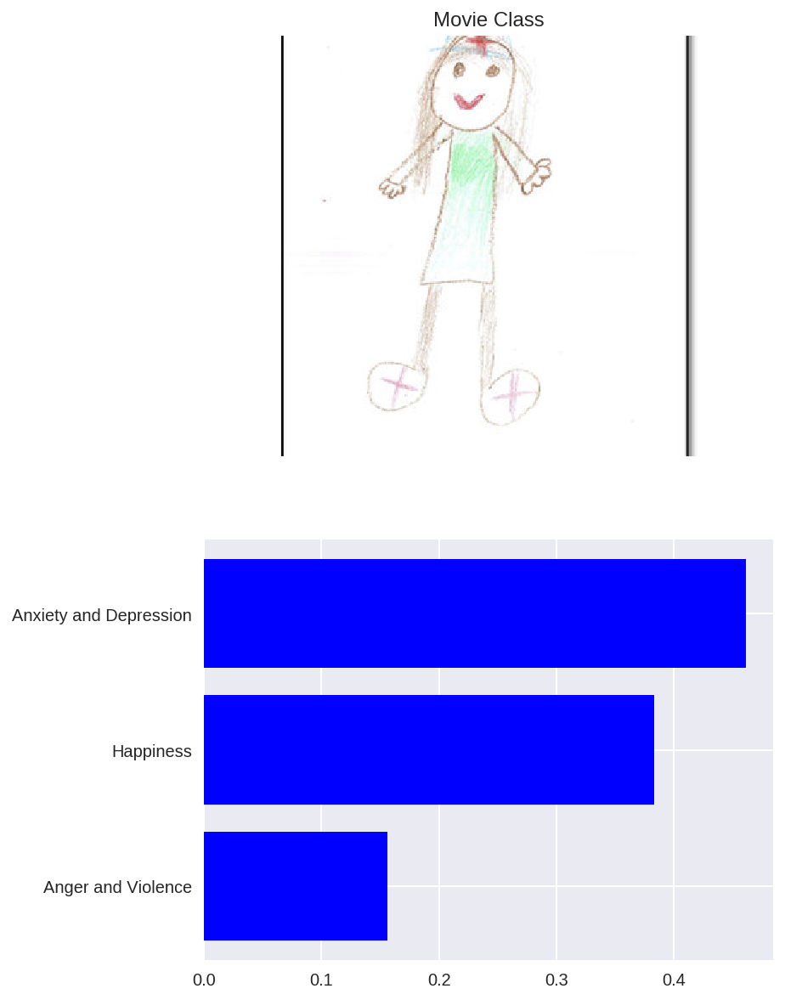

In [0]:
img = 'drawing9.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

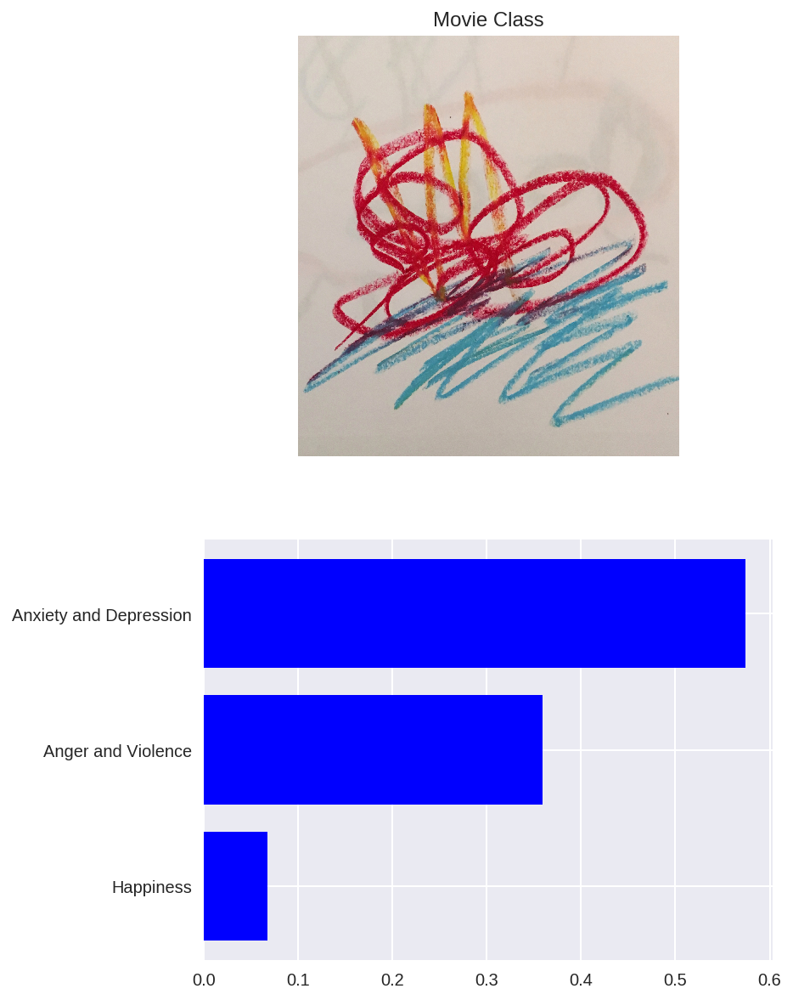

In [0]:
img = 'drawing1.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

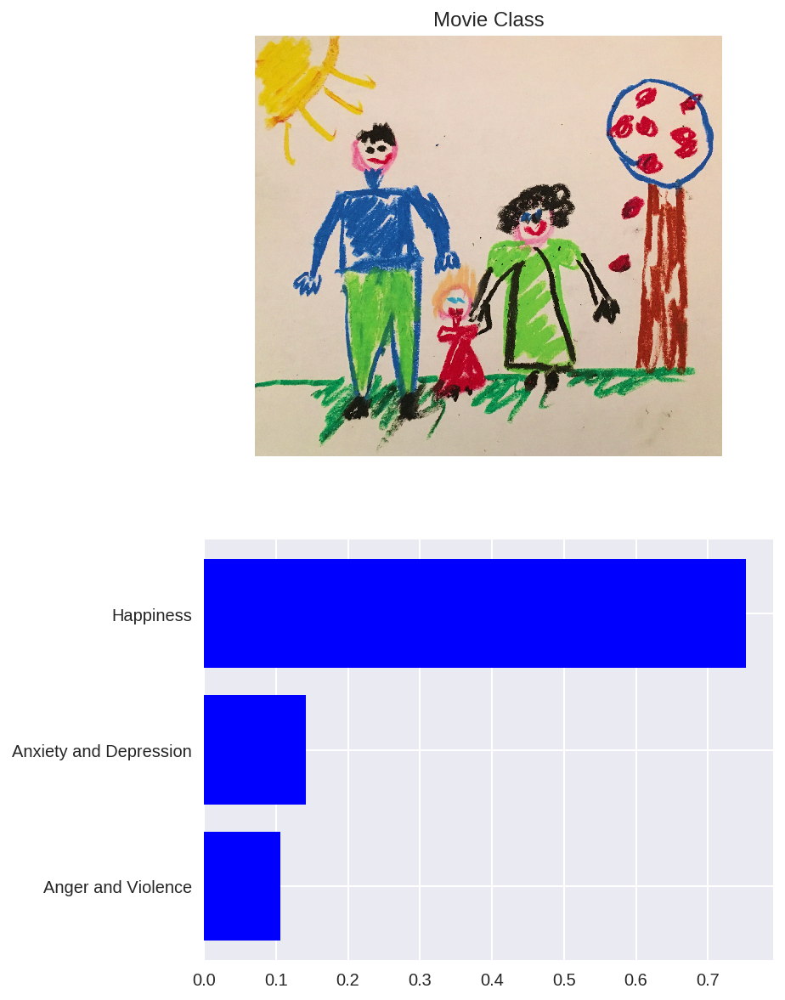

In [0]:
img = 'drawing4.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

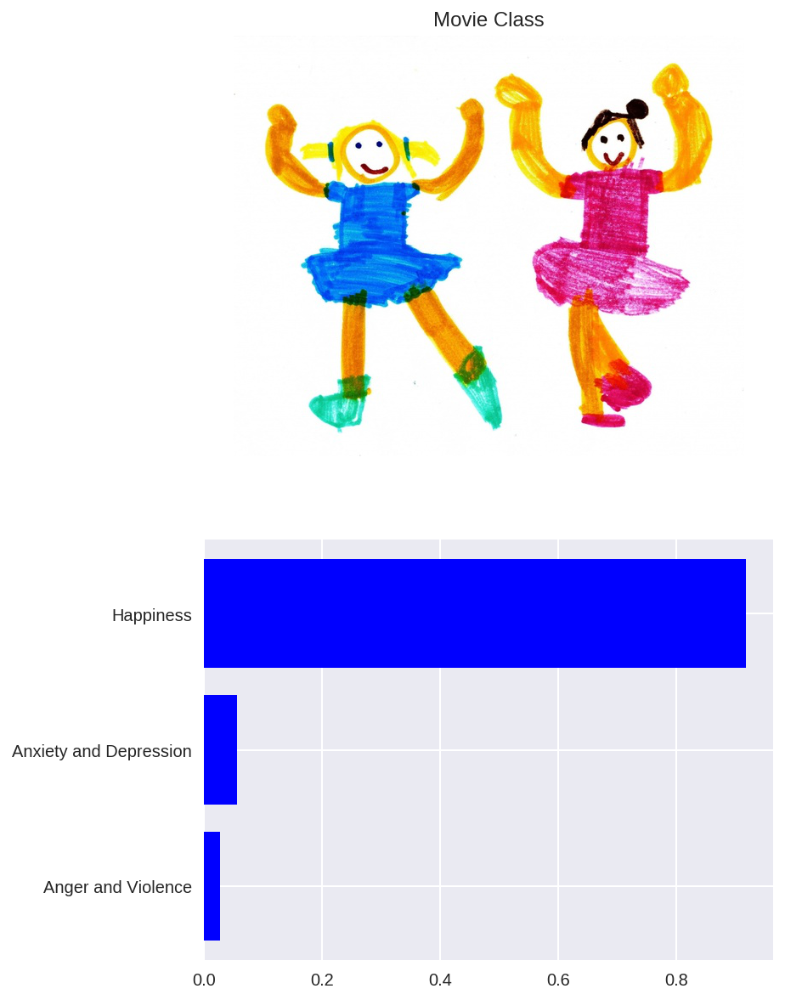

In [0]:
img = 'drawing5.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

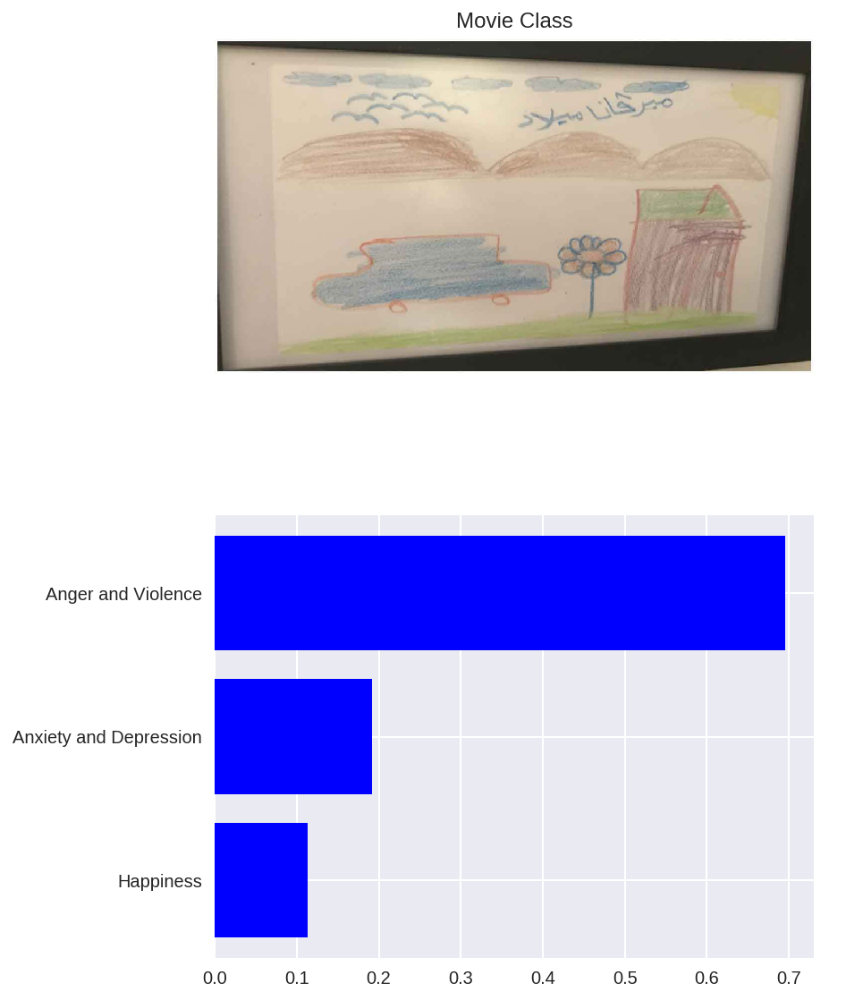

In [0]:
img = 'drawing10.jpeg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

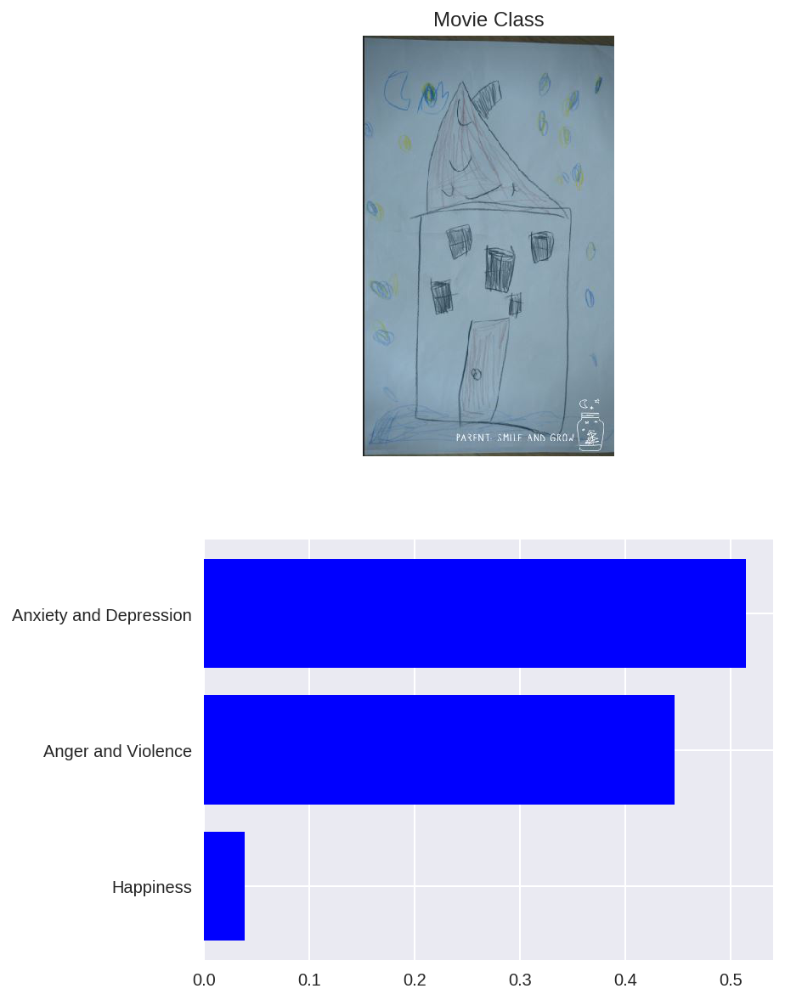

In [0]:
img = 'drawing12.JPG'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

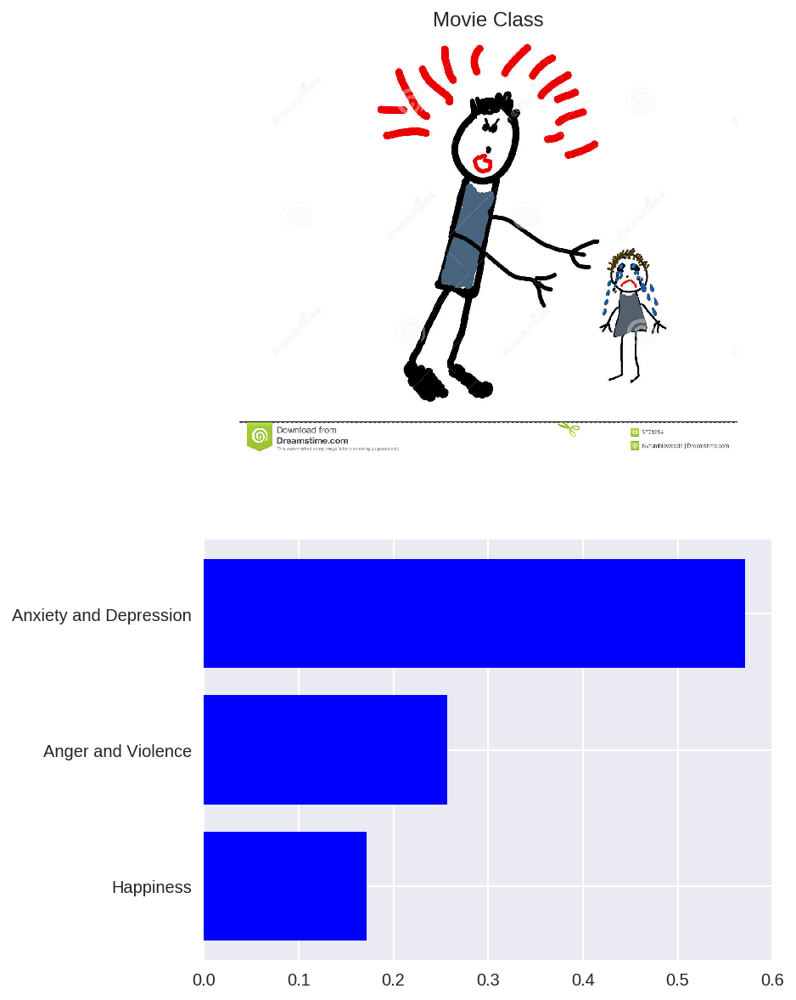

In [0]:
img = '4.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

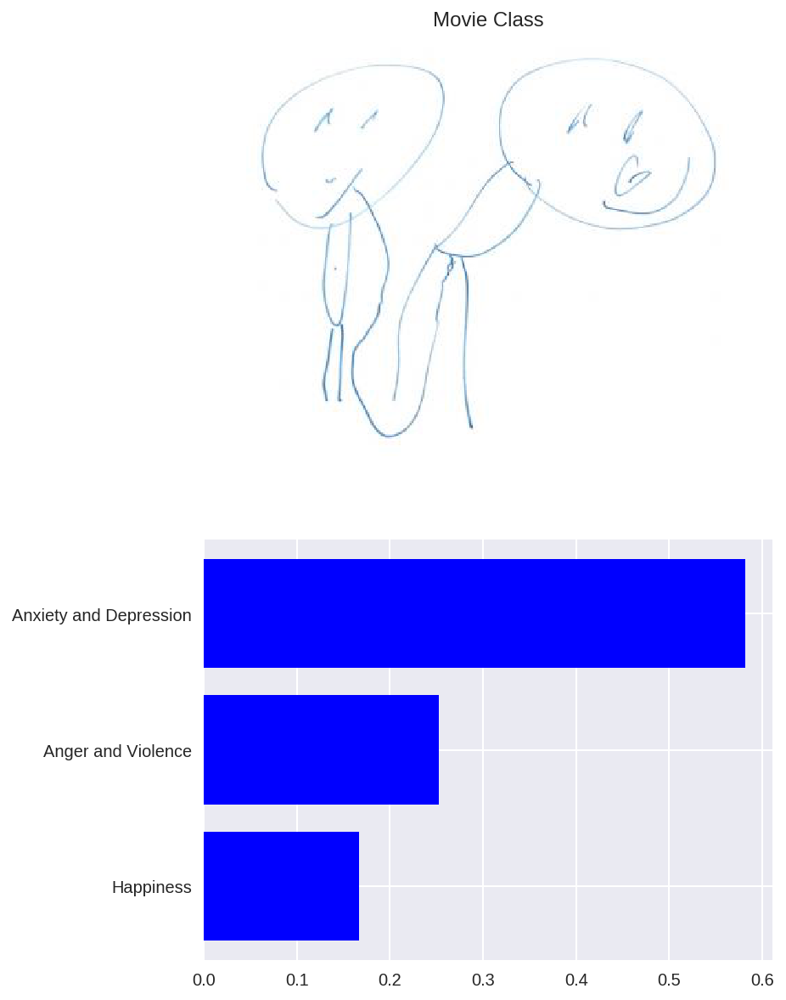

In [0]:
img = '22.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

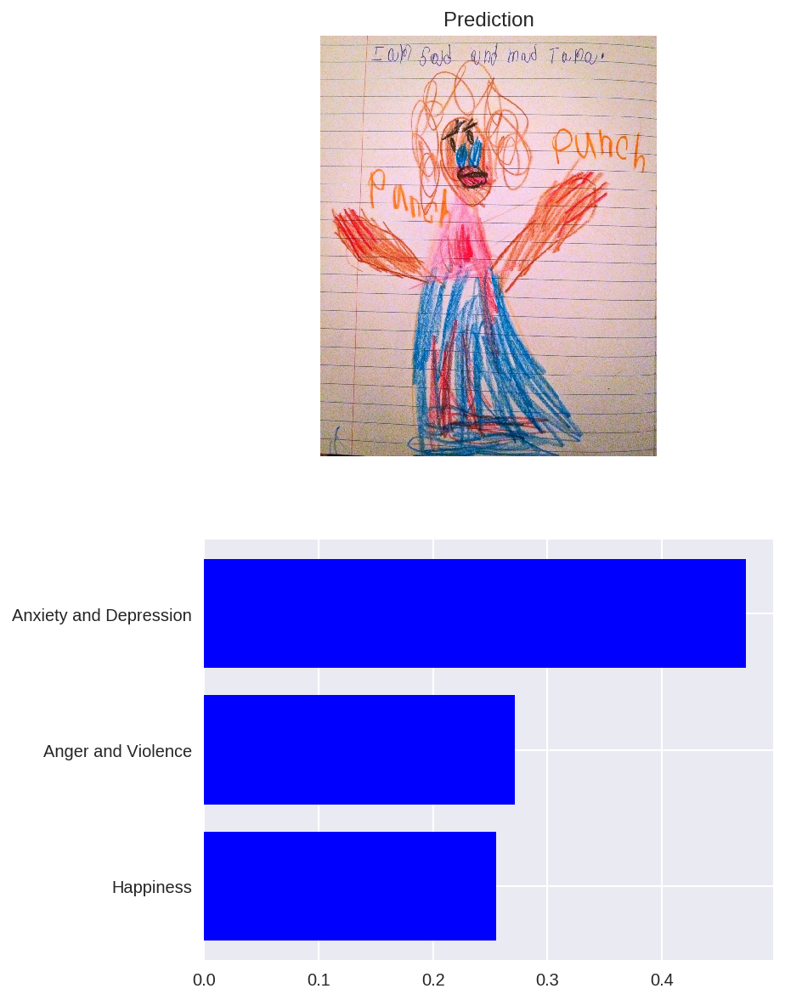

In [0]:
img = '5.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

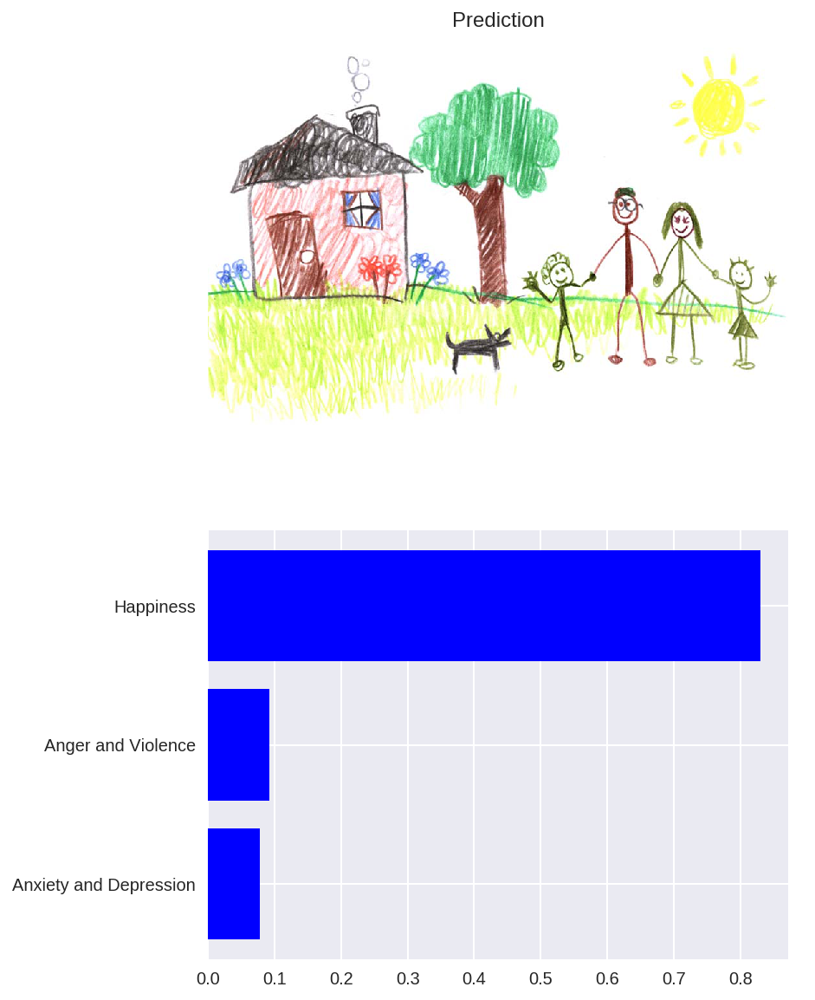

In [0]:
img = 'drawing28.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

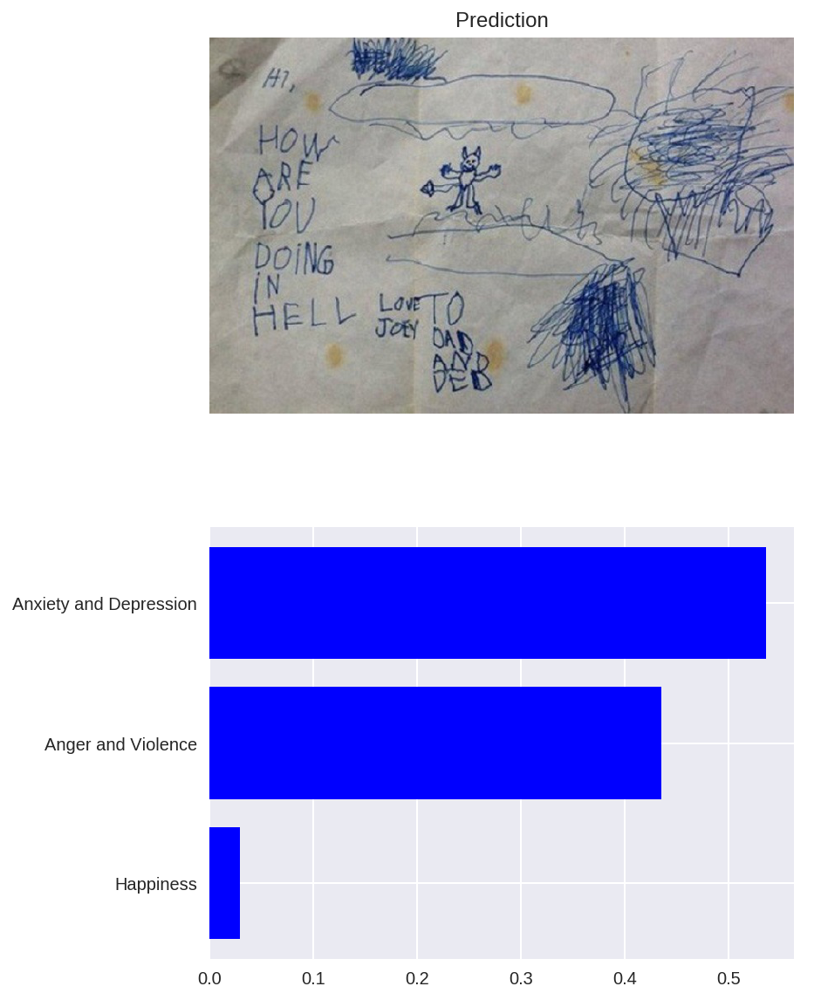

In [0]:
img = 'drawing30.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

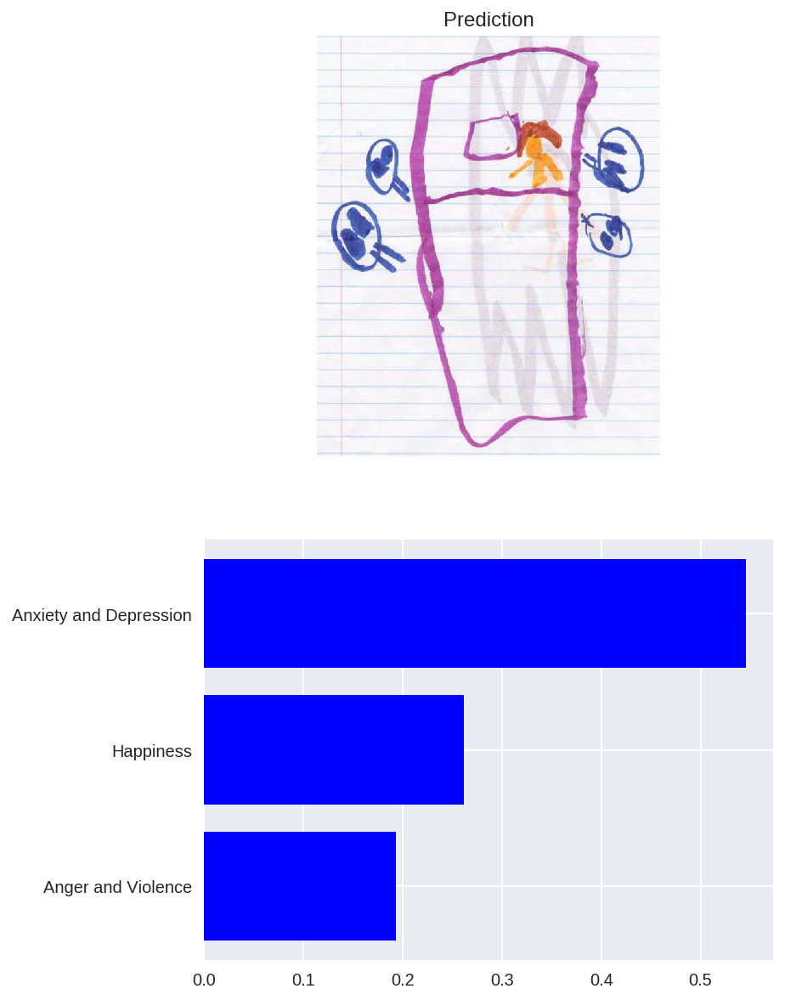

In [0]:
img = 'drawing31.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

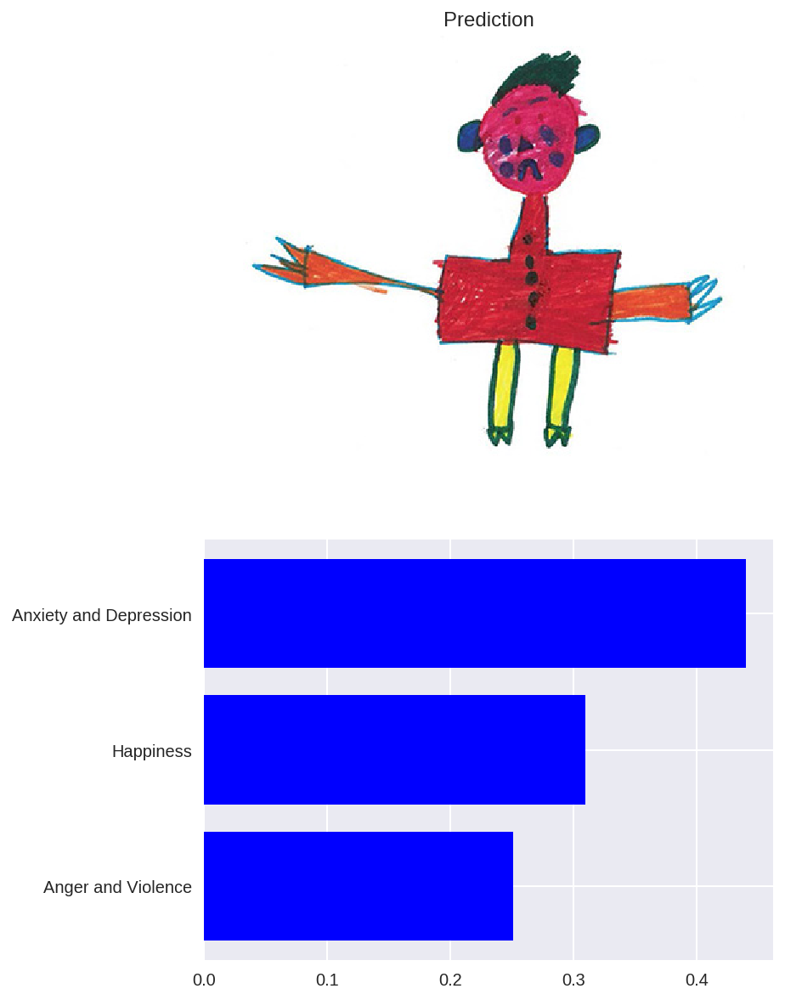

In [0]:
img = 'drawing34.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

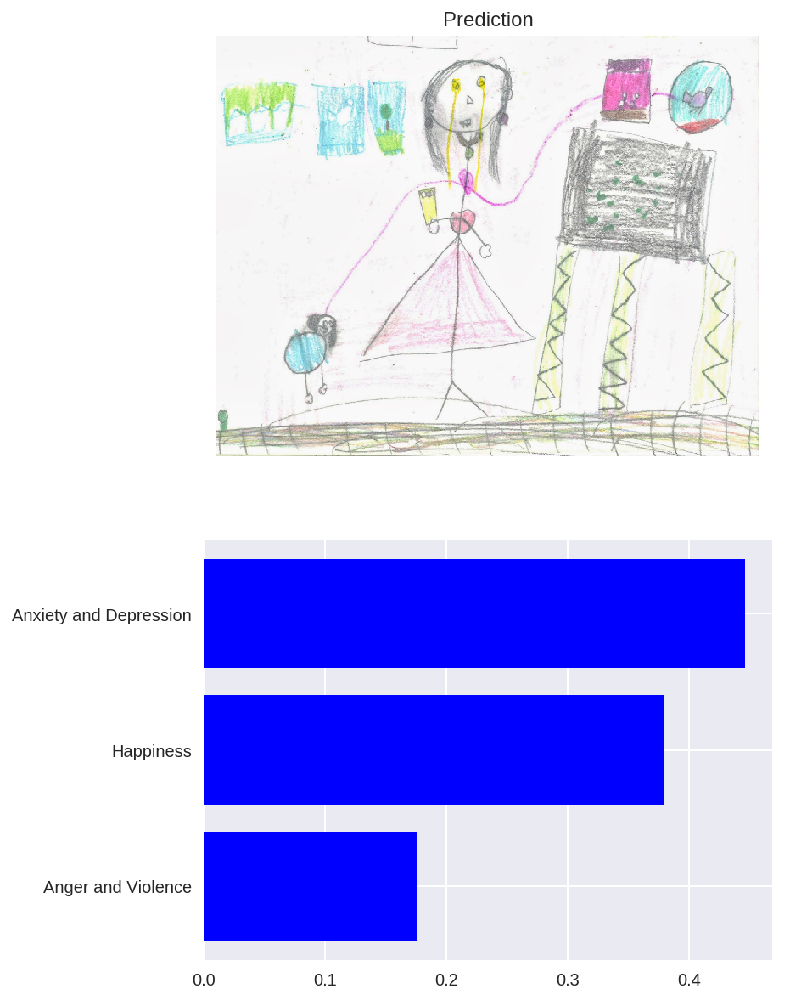

In [0]:
img = 'drawing36.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

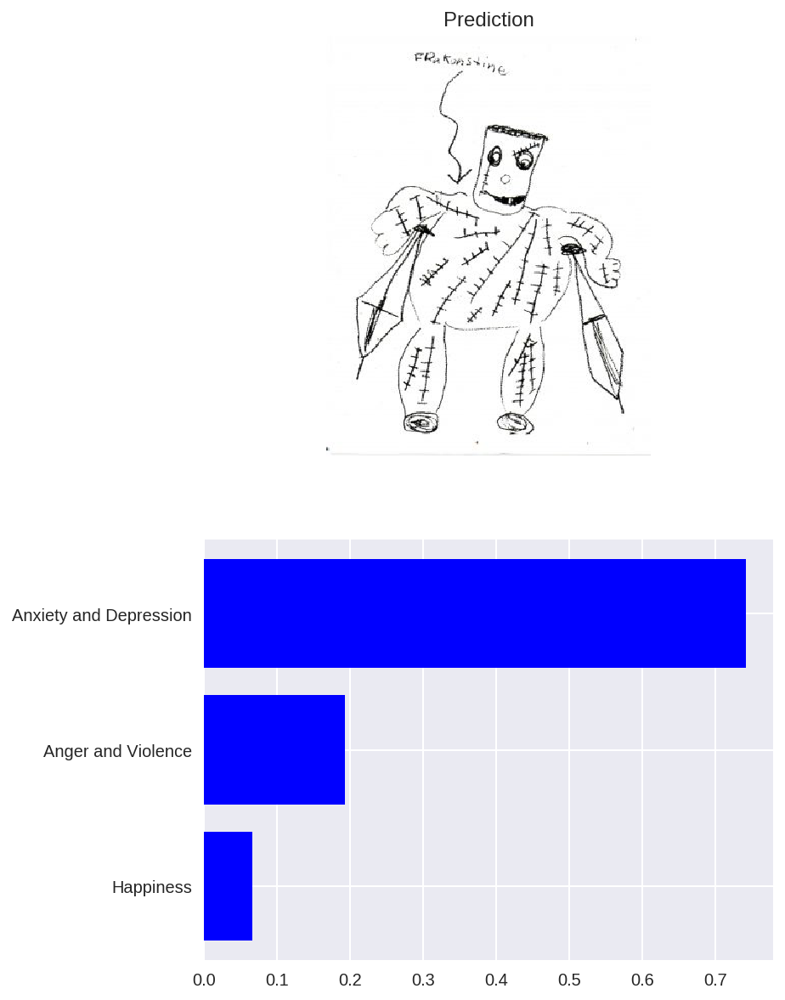

In [0]:
img = 'drawing38.jpg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

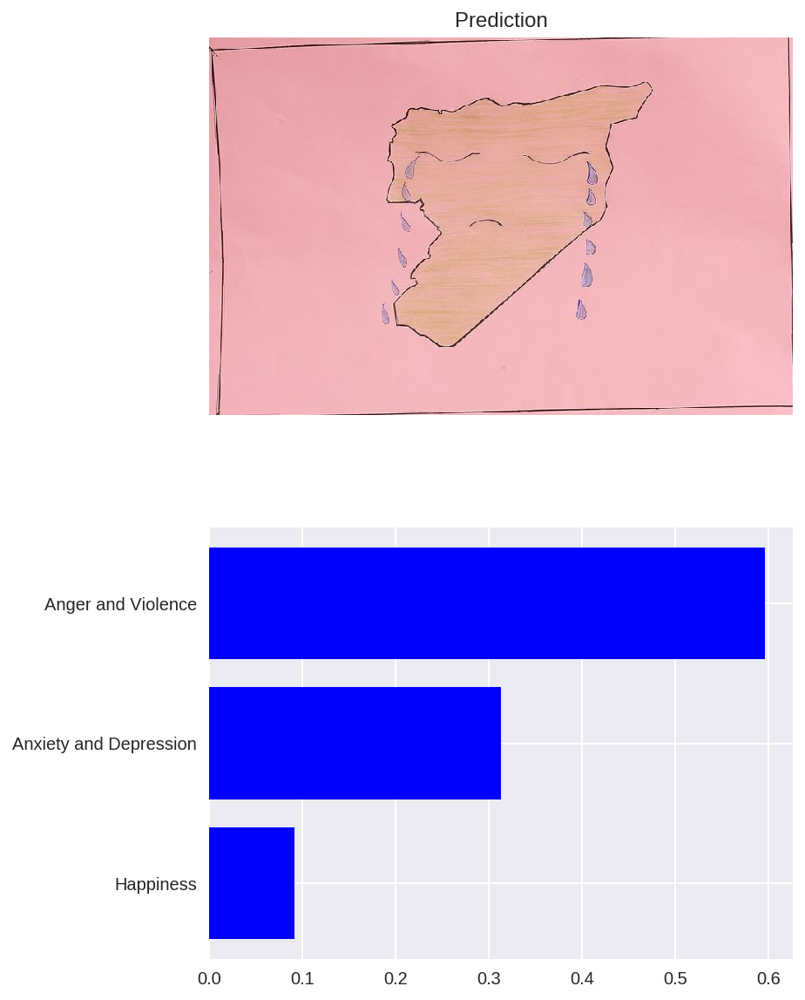

In [0]:
img = 'drawing41.JPG'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)

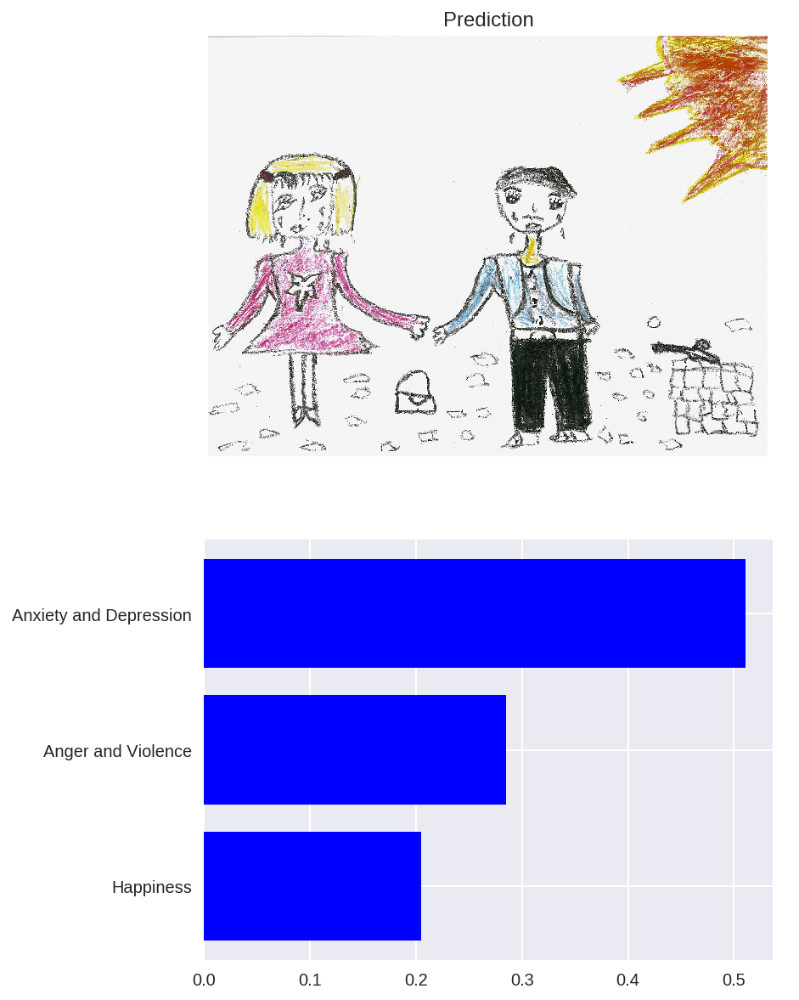

In [0]:
img = 'drawing42.jpeg'
p, c = predict(img, loaded_model)
view_classify(img, p, c, class_names)